In [1]:
# definitely used
import numpy as np
import os
import pandas as pd
import torch
import sys
from tqdm import tqdm
import pickle

import matplotlib.pyplot as plt

from tree_learn.util import get_chunk_around_instance, explore_plotly, get_eval_res_components, get_segmentation_metrics, plot_instance_evaluation_segments

# not yet used

%load_ext autoreload
%autoreload 2


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [3]:
base_dir = '../../../datasets_simlink/data_trees/training_data/forests_voxelized0.1'

n_tree_total = 0
for name in tqdm(os.listdir(base_dir)):
    test_path = os.path.join(base_dir, name)
    test = np.load(test_path)
    n_trees = len(np.unique(test[:, -1])) - 1
    n_tree_total += n_trees

100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


In [4]:
n_tree_total

6665

# utils

In [2]:
FLOOR_NUM_IN_INSTANCE_LABELS = 9999
FLOOR_NUM_IN_INSTANCE_PREDS = 9999


def load_results_lidar360(base_dir, benchmark_forest_path='../../../datasets_simlink/data_trees/for_evaluation/benchmark_forest.npy', floor_num_in_instance_labels=FLOOR_NUM_IN_INSTANCE_LABELS, floor_num_in_instance_preds=FLOOR_NUM_IN_INSTANCE_PREDS, return_onlyeval=False):
    instance_evaluation_path = os.path.join(base_dir, 'instance_evaluation.pt')
    instance_evaluation = torch.load(instance_evaluation_path)

    if return_onlyeval:
        coords_not_propagated_to_benchmark = None
        instance_preds_not_propagated_to_benchmark = None
        pred_cluster_coords = None
        gt_cluster_coords = None
        benchmark_forest = None
        pred_forest = None
        coords = None
        instance_labels = None
        instance_preds = None
    else:
        coords_not_propagated_to_benchmark = None
        instance_preds_not_propagated_to_benchmark = None
        pred_cluster_coords = None
        gt_cluster_coords = None
        benchmark_forest = np.load(benchmark_forest_path)
        coords = benchmark_forest[:, :3]
        instance_labels = benchmark_forest[:, 3]
        instance_preds = instance_evaluation['instance_preds_propagated_to_benchmark_pointcloud']

        pred_forest = np.hstack([coords, instance_preds.reshape(-1, 1)])

    return instance_evaluation, coords_not_propagated_to_benchmark, instance_preds_not_propagated_to_benchmark, pred_cluster_coords, gt_cluster_coords, benchmark_forest, pred_forest, coords, instance_labels, instance_preds


def load_results_treelearn(base_dir, radius, benchmark_forest_path='../../../datasets_simlink/data_trees/for_evaluation/benchmark_forest.npy', floor_num_in_instance_labels=FLOOR_NUM_IN_INSTANCE_LABELS, floor_num_in_instance_preds=FLOOR_NUM_IN_INSTANCE_PREDS, return_onlyeval=False):
    # dirs
    pointwise_data_dir = os.path.join(base_dir, 'pointwise_data')
    eval_results_dir = os.path.join(base_dir, 'eval_results')

    # get instance_evaluation_results
    counter = 0
    for instance_eval_name in os.listdir(eval_results_dir):
        instance_evaluation = torch.load(os.path.join(eval_results_dir, instance_eval_name))
        instance_evaluation['detection_results'] = dict()
        instance_evaluation['segmentation_results'] = dict()
        if instance_evaluation['radius'] == radius:
            counter += 1
            break 
    if counter == 0:
        sys.exit('results for supplied radius were NOT found')

    for key in instance_evaluation['y_greater_zero']['detection_results'].keys():
        if key == 'non_matched_preds_where_corresponding_gt_is_nan':
            instance_evaluation['detection_results'][key] = instance_evaluation['y_greater_zero']['detection_results'][key]
            continue
        y_greater_array = instance_evaluation['y_greater_zero']['detection_results'][key]
        y_not_greater_array = instance_evaluation['y_not_greater_zero']['detection_results'][key]
        instance_evaluation['detection_results'][key] = np.concatenate([y_greater_array, y_not_greater_array])

    for key in instance_evaluation['y_greater_zero']['segmentation_results'].keys(): 
        y_greater_df = instance_evaluation['y_greater_zero']['segmentation_results'][key]
        y_not_greater_df = instance_evaluation['y_not_greater_zero']['segmentation_results'][key]
        instance_evaluation['segmentation_results'][key] = pd.concat([y_greater_df, y_not_greater_df])

    del instance_evaluation['y_greater_zero']
    del instance_evaluation['y_not_greater_zero']
    
    if return_onlyeval:
        instance_evaluation = None
        coords_unprop  = None
        instance_preds_unprop = None 
        instance_labels_unprop  = None
        offset_preds_unprop = None
        instance_preds_unprop_unfilt = None 
        tree_prediction_probs = None
        coords = None
        instance_preds = None 
        instance_labels = None
    else:
        # unpropagated stuff
        coords_unprop = np.load(os.path.join(pointwise_data_dir, 'coords.npy'))
        instance_labels_unprop = np.load(os.path.join(pointwise_data_dir, 'instance_labels.npy'))
        offset_preds_unprop = np.load(os.path.join(pointwise_data_dir, 'offset_predictions.npy'))
        instance_preds_unprop = instance_evaluation['instance_preds_not_propagated_to_benchmark_pointcloud']

        # unpropagated and unfiltered stuff
        if 'instance_preds_not_propagated_to_benchmark_pointcloud_unfiltered' in instance_evaluation:
            instance_preds_unprop_unfilt = instance_evaluation['instance_preds_not_propagated_to_benchmark_pointcloud_unfiltered']
            tree_prediction_probs = instance_evaluation['tree_prediction_probs']
        else:
            instance_preds_unprop_unfilt = None
            tree_prediction_probs = None

        # propagated to benchmark stuff
        benchmark_forest = np.load(benchmark_forest_path)
        coords = benchmark_forest[:, :3]
        instance_labels = benchmark_forest[:, 3]
        instance_preds = instance_evaluation['instance_preds_propagated_to_benchmark_pointcloud']
        instance_preds[instance_preds == -1] = 9999


    return instance_evaluation, (coords_unprop, instance_preds_unprop, instance_labels_unprop, offset_preds_unprop, instance_preds_unprop_unfilt, tree_prediction_probs), (coords, instance_preds, instance_labels)


def get_qualitative_assessment(instance_evaluation, verbose=True):
    if verbose:
        print(f"Number of matched predictions: {len(instance_evaluation['detection_results']['matched_preds'])}")
        print(f"non_matched_predictions: {instance_evaluation['detection_results']['non_matched_preds']}; non_matched_predictions corresponding gt: {instance_evaluation['detection_results']['non_matched_preds_corresponding_gt']}")
        print(f"non_matched_gt: {instance_evaluation['detection_results']['non_matched_gts']}; non_matched_gts_corresponding_larger_tree: {instance_evaluation['detection_results']['non_matched_gts_corresponding_larger_tree']}")
        print(f"non_matched_preds_where_corresponding_gt_is_nan: {instance_evaluation['detection_results']['non_matched_preds_where_corresponding_gt_is_nan']}")

    n_fp = len(instance_evaluation['detection_results']['non_matched_preds'])
    n_fn = len(instance_evaluation['detection_results']['non_matched_gts'])
    return n_fp, n_fn


def get_semantic_assessment(instance_labels, instance_preds, floor_num_in_instance_preds=FLOOR_NUM_IN_INSTANCE_PREDS, floor_num_in_instance_labels=FLOOR_NUM_IN_INSTANCE_LABELS):
    tree_preds = instance_preds != floor_num_in_instance_preds
    tree_labels = instance_labels != FLOOR_NUM_IN_INSTANCE_LABELS
    floor_preds = np.logical_not(tree_preds)
    floor_labels = np.logical_not(tree_labels)

    tp_tree, fp_tree, tn_tree, fn_tree = get_eval_res_components(tree_preds, tree_labels)
    tp_floor, fp_floor, tn_floor, fn_floor = get_eval_res_components(floor_preds, floor_labels)

    acc_tree, prec_tree, rec_tree, f1_tree, fdr_tree, fnr_tree, one_minus_f1_tree, iou_tree, fp_error_rate_tree, fn_error_rate_tree, error_rate_tree = get_segmentation_metrics(tp_tree, fp_tree, tn_tree, fn_tree)
    acc_floor, prec_floor, rec_floor, f1_floor, fdr_floor, fnr_floor, one_minus_f1_floor, iou_floor, fp_error_rate_floor, fn_error_rate_floor, error_rate_floor = get_segmentation_metrics(tp_floor, fp_floor, tn_floor, fn_floor)
    # if you want, you can also return measures for floor and trees separately
    
    print(f'accuracy: {acc_tree}')


def get_instance_assessment(instance_evaluation, n_instances_to_validate=156):
    assert (len(instance_evaluation['segmentation_results']['no_partition']) + len(instance_evaluation['detection_results']['non_matched_gts']) * 2) == n_instances_to_validate
    print(instance_evaluation['segmentation_results']['no_partition'][['prec', 'rec', 'f1', 'iou', 'fp_error_rate', 'fn_error_rate', 'error_rate']].mean(0))

# loading data

In [3]:
eval_lidar360_base_dir = '../../../datasets_simlink/data_trees/eval_lidar360'
eval_treelearn_filter_class_base_dir = '../../../datasets_simlink/data_trees/eval_treelearn_filter_class'
# eval_treelearn_finetuned_base_dir = '../../../datasets_simlink/data_trees/eval_treelearn_finetuned_less_epoch'
eval_treelearn_finetuned_base_dir = '../../../datasets_simlink/data_trees/eval_treelearn_finetuned_filter_class'

radius = 0.2

# lidar360 results
instance_evaluation_lidar360, coords_not_propagated_to_benchmark_lidar360, instance_preds_not_propagated_to_benchmark_lidar360, pred_cluster_coords_lidar360, gt_cluster_coords_lidar360, benchmark_forest_lidar360, pred_forest_lidar360, coords_lidar360, instance_labels_lidar360, instance_preds_lidar360 = load_results_lidar360(eval_lidar360_base_dir)

# treelearn results
instance_evaluation, stuff_unprop, stuff_prop = load_results_treelearn(eval_treelearn_filter_class_base_dir, radius)
coords_unprop_noft, instance_preds_unprop_noft, instance_labels_unprop_noft, offset_preds_unprop_noft, instance_preds_unprop_unfilt_noft, tree_prediction_probs_noft = stuff_unprop
coords_noft, instance_preds_noft, instance_labels_noft = stuff_prop

# treelearn finetuned results
instance_evaluation_ft, stuff_unprop, stuff_prop = load_results_treelearn(eval_treelearn_finetuned_base_dir, radius)
coords_unprop_ft, instance_preds_unprop_ft, instance_labels_unprop_ft, offset_preds_unprop_ft, instance_preds_unprop_unfilt_ft, tree_prediction_probs_ft = stuff_unprop
coords_ft, instance_preds_ft, instance_labels_ft = stuff_prop


# qualitative assessment of detections

In [4]:
# lidar360
get_qualitative_assessment(instance_evaluation_lidar360)

Number of matched predictions: 155
non_matched_predictions: [225]; non_matched_predictions corresponding gt: [189]
non_matched_gt: [221]; non_matched_gts_corresponding_larger_tree: [233]
non_matched_preds_where_corresponding_gt_is_nan: []


(1, 1)

In [5]:
# treelearn
get_qualitative_assessment(instance_evaluation)

Number of matched predictions: 156
non_matched_predictions: []; non_matched_predictions corresponding gt: []
non_matched_gt: []; non_matched_gts_corresponding_larger_tree: []
non_matched_preds_where_corresponding_gt_is_nan: []


(0, 0)

In [6]:
# finetuned
get_qualitative_assessment(instance_evaluation_ft)

Number of matched predictions: 155
non_matched_predictions: []; non_matched_predictions corresponding gt: []
non_matched_gt: [35]; non_matched_gts_corresponding_larger_tree: [72]
non_matched_preds_where_corresponding_gt_is_nan: []


(0, 1)

# semantic segmentation

In [7]:
# lidar360
get_semantic_assessment(instance_labels_lidar360, instance_preds_lidar360)

accuracy: 0.9959120568949275


In [8]:
# treelearn
get_semantic_assessment(instance_labels_noft, instance_preds_noft)

accuracy: 0.9963991516141617


In [9]:
# finetuned
get_semantic_assessment(instance_labels_ft, instance_preds_ft)

accuracy: 0.9985546872657145


# instance segmentation

In [10]:
# lidar360
get_instance_assessment(instance_evaluation_lidar360)

prec             0.925191
rec              0.948132
f1               0.932065
iou              0.877986
fp_error_rate    0.072483
fn_error_rate    0.049531
error_rate       0.122014
dtype: float64


In [11]:
# treelearn
get_instance_assessment(instance_evaluation)

prec             0.935794
rec              0.953995
f1               0.940723
iou              0.893584
fp_error_rate    0.062325
fn_error_rate    0.044092
error_rate       0.106416
dtype: float64


In [12]:
# finetuned
get_instance_assessment(instance_evaluation_ft)

prec             0.979429
rec              0.986176
f1               0.982070
iou              0.966322
fp_error_rate    0.020225
fn_error_rate    0.013453
error_rate       0.033678
dtype: float64


In [ ]:
# plot_instance_evaluation_segments(ax, values_net, values_net_finetuned, values_software, measure="F1-Score", include_legend=False, do_barplot=True, y_range=[0.6, 1], y_step=10, colors=["#ff7f0e", "#1f77b4", "#2ca02c"]):
colors = ['#010003', '#00baab', '#a60a1f']

fontsize=7
fig_size=(4,1)
legend_size = 7
bbox_to_anchor = (0.5, 1.35)
y_range=[60, 100]
labels = ['lidar360', 'noisy labels', 'fine-tuned']
x_label = "Center \u2192 Outer branches"
fig, axs = plt.subplots(1, 3, figsize=fig_size)
plt.tight_layout()

# precision
values_net_finetuned = instance_evaluation_ft['segmentation_results']['xy_partition_relative'].iloc[:, 2:12].mean(0).to_numpy() * 100
values_net = instance_evaluation['segmentation_results']['xy_partition_relative'].iloc[:, 2:12].mean(0).to_numpy() * 100
values_software = instance_evaluation_lidar360['segmentation_results']['xy_partition_relative'].iloc[:, 2:12].mean(0).to_numpy() * 100
axs[0] = plot_instance_evaluation_segments(axs[0], values_software, values_net, values_net_finetuned, fontsize=fontsize, legend_size=legend_size, 
                        bbox_to_anchor=bbox_to_anchor, measure="Precision in %", labels=labels, include_legend=False, y_range=y_range, colors=colors, x_label=x_label)

# recall
values_net_finetuned = instance_evaluation_ft['segmentation_results']['xy_partition_relative'].iloc[:, 12:22].mean(0).to_numpy() * 100
values_net = instance_evaluation['segmentation_results']['xy_partition_relative'].iloc[:, 12:22].mean(0).to_numpy() * 100
values_software = instance_evaluation_lidar360['segmentation_results']['xy_partition_relative'].iloc[:, 12:22].mean(0).to_numpy() * 100
axs[1] = plot_instance_evaluation_segments(axs[1], values_software, values_net, values_net_finetuned, fontsize=fontsize, legend_size=legend_size, 
                        bbox_to_anchor=bbox_to_anchor, measure="Recall in %", labels=labels, include_legend=True, y_range=y_range, colors=colors, x_label=x_label)


# f1-score
values_net_finetuned = instance_evaluation_ft['segmentation_results']['xy_partition_relative'].iloc[:, 22:32].mean(0).to_numpy() * 100
values_net = instance_evaluation['segmentation_results']['xy_partition_relative'].iloc[:, 22:32].mean(0).to_numpy() * 100
values_software = instance_evaluation_lidar360['segmentation_results']['xy_partition_relative'].iloc[:, 22:32].mean(0).to_numpy() * 100
axs[2] = plot_instance_evaluation_segments(axs[2], values_software, values_net, values_net_finetuned, fontsize=fontsize, legend_size=legend_size, 
                        bbox_to_anchor=bbox_to_anchor, measure="F1-Score in %", labels=labels, include_legend=False, y_range=y_range, colors=colors, x_label=x_label)

fig.subplots_adjust(wspace=0.45, left=0, right=1, bottom=0.15, top=1)
save_path = "../../../datasets_simlink/data_trees/graphics/xy_partition.pdf"
plt.savefig(save_path, format="pdf", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# plot_instance_evaluation_segments(ax, values_net, values_net_finetuned, values_software, measure="F1-Score", include_legend=False, do_barplot=True, y_range=[0.6, 1], y_step=10, colors=["#ff7f0e", "#1f77b4", "#2ca02c"]):

fontsize=7
fig_size=(4,1)
legend_size = 7
bbox_to_anchor = (0.5, 1.4)
y_range=[60, 100]
labels = ['lidar360', 'noisy labels', 'fine-tuned']
x_label = "Bottom \u2192 Top"

fig, axs = plt.subplots(1, 3, figsize=fig_size)
plt.tight_layout()

# precision
values_net_finetuned = instance_evaluation_ft['segmentation_results']['z_partition_relative'].iloc[:, 2:12].mean(0).to_numpy() * 100
values_net = instance_evaluation['segmentation_results']['z_partition_relative'].iloc[:, 2:12].mean(0).to_numpy() * 100
values_software = instance_evaluation_lidar360['segmentation_results']['z_partition_relative'].iloc[:, 2:12].mean(0).to_numpy() * 100
axs[0] = plot_instance_evaluation_segments(axs[0], values_software, values_net, values_net_finetuned, fontsize=fontsize, legend_size=legend_size, 
                    bbox_to_anchor=bbox_to_anchor, measure="Precision in %", labels=labels, include_legend=False, y_range=y_range, colors=colors, x_label=x_label)

# recall
values_net_finetuned = instance_evaluation_ft['segmentation_results']['z_partition_relative'].iloc[:, 12:22].mean(0).to_numpy() * 100
values_net = instance_evaluation['segmentation_results']['z_partition_relative'].iloc[:, 12:22].mean(0).to_numpy() * 100
values_software = instance_evaluation_lidar360['segmentation_results']['z_partition_relative'].iloc[:, 12:22].mean(0).to_numpy() * 100
axs[1] = plot_instance_evaluation_segments(axs[1], values_software, values_net, values_net_finetuned, fontsize=fontsize, legend_size=legend_size, 
                    bbox_to_anchor=bbox_to_anchor, measure="Recall in %", labels=labels, include_legend=False, y_range=y_range, colors=colors, x_label=x_label)


# f1-score
values_net_finetuned = instance_evaluation_ft['segmentation_results']['z_partition_relative'].iloc[:, 22:32].mean(0).to_numpy() * 100
values_net = instance_evaluation['segmentation_results']['z_partition_relative'].iloc[:, 22:32].mean(0).to_numpy() * 100
values_software = instance_evaluation_lidar360['segmentation_results']['z_partition_relative'].iloc[:, 22:32].mean(0).to_numpy() * 100
axs[2] = plot_instance_evaluation_segments(axs[2], values_software, values_net, values_net_finetuned, fontsize=fontsize, legend_size=legend_size,
                    bbox_to_anchor=bbox_to_anchor, measure="F1-Score in %", labels=labels, include_legend=False, y_range=y_range, colors=colors, x_label=x_label)

fig.subplots_adjust(wspace=0.45, left=0, right=1, bottom=0.15, top=1)

save_path = "../../../datasets_simlink/data_trees/graphics/z_partition.pdf"
plt.savefig(save_path, format="pdf", dpi=300, bbox_inches='tight')
plt.show()

# load results for viz

In [41]:
# propagated
coords_prop = coords_noft
instance_preds_prop = instance_preds_noft
instance_labels_prop = instance_labels_noft

benchmark_forest = np.hstack([coords_prop, instance_labels_prop.reshape(-1, 1)])
pred_forest = np.hstack([coords_prop, instance_preds_prop.reshape(-1, 1)])

# not propagated
coords_unprop = coords_unprop_noft
instance_preds_unprop = instance_preds_unprop_noft
instance_labels_unprop = instance_labels_unprop_noft
offset_preds_unprop = offset_preds_unprop_noft

pred_forest_unprop = np.hstack([coords_unprop, instance_preds_unprop.reshape(-1, 1)])
gt_forest_unprop = np.hstack([coords_unprop, instance_labels_unprop.reshape(-1, 1)])

cluster_coords_unprop = coords_unprop + offset_preds_unprop
pred_cluster_coords_unprop = np.hstack([cluster_coords_unprop, instance_preds_unprop.reshape(-1, 1)])
gt_cluster_coords_unprop = np.hstack([cluster_coords_unprop, instance_labels_unprop.reshape(-1, 1)])

# not propagated and not filtered
instance_preds_unprop_unfilt = instance_preds_unprop_unfilt_noft
tree_prediction_probs_unprop = tree_prediction_probs_noft

if instance_preds_unprop_unfilt is not None:
    pred_forest_unprop_unfilt = np.hstack([coords_unprop, instance_preds_unprop_unfilt.reshape(-1, 1)])
    pred_cluster_coords_unprop_unfilt = np.hstack([cluster_coords_unprop, instance_preds_unprop_unfilt.reshape(-1, 1)])

# explore predicted probabilities
if tree_prediction_probs_unprop is not None:
    tree_prediction_probs_argsort = np.argsort(tree_prediction_probs_unprop)
    tree_prediction_probs_sorted = tree_prediction_probs_unprop[tree_prediction_probs_argsort]


    plt.scatter(range(len(tree_prediction_probs_sorted)), tree_prediction_probs_sorted)

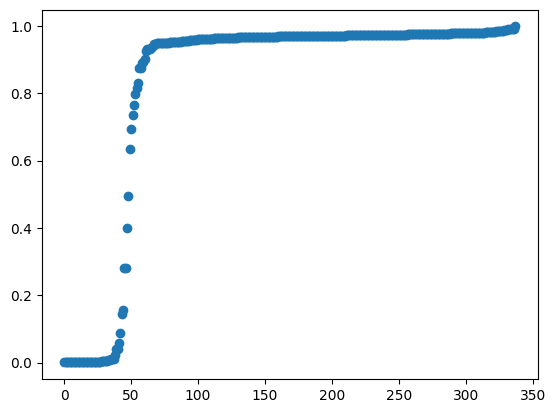

In [42]:
# propagated
coords_prop = coords_ft
instance_preds_prop = instance_preds_ft
instance_labels_prop = instance_labels_ft

benchmark_forest = np.hstack([coords_prop, instance_labels_prop.reshape(-1, 1)])
pred_forest = np.hstack([coords_prop, instance_preds_prop.reshape(-1, 1)])

# not propagated
coords_unprop = coords_unprop_ft
instance_preds_unprop = instance_preds_unprop_ft
instance_labels_unprop = instance_labels_unprop_ft
offset_preds_unprop = offset_preds_unprop_ft

pred_forest_unprop = np.hstack([coords_unprop, instance_preds_unprop.reshape(-1, 1)])
gt_forest_unprop = np.hstack([coords_unprop, instance_labels_unprop.reshape(-1, 1)])

cluster_coords_unprop = coords_unprop + offset_preds_unprop
pred_cluster_coords_unprop = np.hstack([cluster_coords_unprop, instance_preds_unprop.reshape(-1, 1)])
gt_cluster_coords_unprop = np.hstack([cluster_coords_unprop, instance_labels_unprop.reshape(-1, 1)])

# not propagated and not filtered
instance_preds_unprop_unfilt = instance_preds_unprop_unfilt_ft
tree_prediction_probs_unprop = tree_prediction_probs_ft

pred_forest_unprop_unfilt = np.hstack([coords_unprop, instance_preds_unprop_unfilt.reshape(-1, 1)])
pred_cluster_coords_unprop_unfilt = np.hstack([cluster_coords_unprop, instance_preds_unprop_unfilt.reshape(-1, 1)])

# explore predicted probabilities
tree_prediction_probs_argsort = np.argsort(tree_prediction_probs_unprop)
tree_prediction_probs_sorted = tree_prediction_probs_unprop[tree_prediction_probs_argsort]

plt.scatter(np.arange(len(tree_prediction_probs_sorted)), tree_prediction_probs_sorted)



# coords_unprop, labels=instance_labels_unprop, inst_num=35, edge_length=20, ignore_label=None)
# explore_plotly(pred_cluster_coords[plot_mask], renderer="notebook", subset=10)

In [10]:
mask = (tree_prediction_probs_sorted < 0.01) & (tree_prediction_probs_sorted > 0.001)
tree_prediction_probs_argsort[mask]

tensor([312, 112,  32, 314, 325, 332, 313, 309, 273, 118, 119, 321, 320, 331,
        330, 318, 337, 150, 300, 286, 335])

In [82]:
tree_prediction_probs_unprop[222]

tensor(0.1563)

In [9]:
tree_prediction_probs_unprop[336]

tensor(0.1428)

# explore unfiltered results

In [ ]:
# explore based on instance_label
plot_mask = get_chunk_around_instance(coords=coords_unprop, labels=instance_labels_unprop, inst_num=35, edge_length=20, ignore_label=None)
explore_plotly(np.hstack([coords_unprop, instance_preds_unprop_unfilt.reshape(-1, 1)])[plot_mask], renderer="notebook", subset=50)

In [ ]:
explore_plotly(np.hstack([coords_unprop, instance_labels_unprop.reshape(-1, 1)])[plot_mask], renderer="notebook", subset=50)

In [ ]:
explore_plotly(np.hstack([coords_unprop, instance_preds_unprop.reshape(-1, 1)])[plot_mask], renderer="notebook", subset=50)

In [225]:
plot_mask = get_chunk_around_instance(coords=coords_unprop, labels=instance_preds_unprop, inst_num=42, edge_length=20, ignore_label=None)
explore_plotly(np.hstack([coords_unprop, instance_preds_unprop.reshape(-1, 1)]), renderer="notebook", subset=50)

In [ ]:
# explore based on pred number not propagated and unfiltered
plot_mask = get_chunk_around_instance(coords=coords_unprop, labels=instance_preds_unprop_unfilt, inst_num=312, edge_length=20, ignore_label=None)
explore_plotly(pred_forest_unprop_unfilt[plot_mask], renderer="notebook", subset=50)


In [ ]:
# explore cluster space
plot_mask = get_chunk_around_instance(coords=coords_unprop, labels=instance_preds_unprop_unfilt, inst_num=8, edge_length=20, ignore_label=None)
explore_plotly(pred_cluster_coords_unprop_unfilt[plot_mask], renderer="notebook", subset=50)


In [92]:
import geopandas
import alphashape

import numpy as np
import pandas as pd
import open3d as o3d
import os
import os.path as osp
import tqdm
import torch
from shapely.geometry import Point
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from scipy import stats
from sklearn.cluster import DBSCAN
from tree_learn.util.data_preparation import voxelize, compute_features, load_data, sor_filter, SampleGenerator
from tree_learn.util.train import get_voxel_sizes


N_CPUS = 4
NOISE_LABEL_IN_GROUPING = -2
EPSILON_EUCLIDEAN_CLUSTERING = 0.15
EPSILON_SOR_FILTER = 0.00001 # ensures that every point with roughly above average distance is discarded
UNDERSTORY_LABEL_IN_GROUPING = -1
LOCAL_FILTERING_RADIUS = 0.2




import open3d as o3d

def sor_filter(chunk, n_neigh_sor, multiplier_sor):

    points = chunk[:, :3]
    assert len(points) > 0
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    
    # filter out based on stastistical outlier
    _, ind = pcd.remove_statistical_outlier(nb_neighbors=n_neigh_sor,  std_ratio=multiplier_sor)
    pcd = pcd.select_by_index(ind)
    mask = np.zeros(len(points),dtype=bool)
    mask[ind] = True
    return mask


def make_labels_consecutive(labels, start_num=0):
    palette = np.unique(labels)
    palette = np.sort(palette)
    key = np.arange(0, len(palette))
    index = np.digitize(labels, palette, right=True)
    labels = key[index]
    labels = labels + start_num
    return labels



def group_dbscan(cluster_coords, radius, npoint_thr, start_num_preds, downsample=False):
    if downsample:
        voxel_size = radius/4
        pcd = o3d.geometry.PointCloud()
        pcd.points = o3d.utility.Vector3dVector(cluster_coords)
        voxel_grid = o3d.geometry.VoxelGrid.create_from_point_cloud(pcd, voxel_size)
        voxels = voxel_grid.get_voxels()

        # get cluster coords of voxelized point cloud and mapping from voxel grid coordinates to integers
        mapping = dict()
        voxel_coords = []
        for i, voxel in tqdm.tqdm(enumerate(voxels)):
            voxel_coords.append(voxel_grid.get_voxel_center_coordinate(voxel.grid_index))
            mapping[tuple(voxel.grid_index)] = i
        voxel_coords = np.array(voxel_coords)

        # associate original points with voxel grid coordinates using the integers obtained from mapping above
        v2p_map = []
        for row in tqdm.tqdm(cluster_coords):
            v2p_map.append(mapping[tuple(voxel_grid.get_voxel(row))])
        v2p_map = np.array(v2p_map)
        cluster_coords = voxel_coords

        # DBSCAN
        print('clustering')
        clustering = DBSCAN(eps=radius, min_samples=2, n_jobs=N_CPUS).fit(cluster_coords)
        clustering.labels_ = clustering.labels_[v2p_map]

        cluster_nums, n_points = np.unique(clustering.labels_, return_counts=True)
        valid_cluster_nums = cluster_nums[(n_points >= npoint_thr) & (cluster_nums != -1)]
        ind_valid = np.isin(clustering.labels_, valid_cluster_nums)
        clustering.labels_[ind_valid] = make_labels_consecutive(clustering.labels_[ind_valid], start_num=start_num_preds)
        clustering.labels_[np.logical_not(ind_valid)] = NOISE_LABEL_IN_GROUPING


    else:
        clustering = DBSCAN(eps=radius, min_samples=2, n_jobs=N_CPUS).fit(cluster_coords)
        cluster_nums, n_points = np.unique(clustering.labels_, return_counts=True)
        valid_cluster_nums = cluster_nums[(n_points >= npoint_thr) & (cluster_nums != -1)]
        ind_valid = np.isin(clustering.labels_, valid_cluster_nums)
        clustering.labels_[ind_valid] = make_labels_consecutive(clustering.labels_[ind_valid], start_num=start_num_preds)
        clustering.labels_[np.logical_not(ind_valid)] = NOISE_LABEL_IN_GROUPING
    return clustering.labels_





In [ ]:
# coords_unprop = np.load(os.path.join(pointwise_data_dir, 'coords.npy'))
# instance_labels_unprop = np.load(os.path.join(pointwise_data_dir, 'instance_labels.npy'))
# offset_preds_unprop = np.load(os.path.join(pointwise_data_dir, 'offset_predictions.npy'))

In [115]:
# tree_inds = np.where(instance_labels_unprop[instance_labels_unprop != 9999])[0]
semantic_prediction_logits = np.load('../../../datasets_simlink/data_trees/eval_treelearn_filter_class/pointwise_data/semantic_prediction_logits.npy')
semantic_prediction_probs = torch.from_numpy(semantic_prediction_logits).float().softmax(dim=-1)
tree_inds = (semantic_prediction_probs[:, 0] >= 0.5).nonzero().view(-1).numpy()
mask_sor = sor_filter(coords_unprop[tree_inds] + offset_preds_unprop[tree_inds], n_neigh_sor=100, multiplier_sor=0.00001)
tree_inds_keep = tree_inds[mask_sor]

In [116]:
tree_inds_keep = tree_inds[mask_sor]
tree_mask_keep = np.zeros(len(instance_labels_unprop)).astype('bool')
tree_mask_keep[tree_inds_keep] = 1

In [117]:
mask_trees_of_interest_gt = np.isin(instance_labels_unprop, [35, 76, 59, 72])
mask_trees_of_interest_pred = np.isin(instance_preds_unprop, [26, 125, 246])
mask_trees_of_interest_pred_unfilt = np.isin(instance_preds_unprop_unfilt, [256, 129, 26, 222, 310, 248, 308, 300])

In [118]:
gt_forest_unprop_of_interest = gt_forest_unprop[mask_trees_of_interest_gt & tree_mask_keep]
gt_cluster_coords_unprop_of_interest = gt_cluster_coords_unprop[mask_trees_of_interest_gt & tree_mask_keep]

pred_forest_unprop_of_interest = pred_forest_unprop[mask_trees_of_interest_pred & tree_mask_keep]
pred_cluster_coords_unprop_of_interest = pred_cluster_coords_unprop[mask_trees_of_interest_pred & tree_mask_keep]

pred_forest_unprop_unfilt_of_interest = pred_forest_unprop_unfilt[mask_trees_of_interest_pred_unfilt & tree_mask_keep]
pred_cluster_coords_unprop_unfilt_of_interest = pred_cluster_coords_unprop_unfilt[mask_trees_of_interest_pred_unfilt & tree_mask_keep]


# gt_forest_unprop_of_interest = gt_forest_unprop[mask_trees_of_interest_gt]
# gt_cluster_coords_unprop_of_interest = gt_cluster_coords_unprop[mask_trees_of_interest_gt]

# pred_forest_unprop_of_interest = pred_forest_unprop[mask_trees_of_interest_pred]
# pred_cluster_coords_unprop_of_interest = pred_cluster_coords_unprop[mask_trees_of_interest_pred]

# pred_forest_unprop_unfilt_of_interest = pred_forest_unprop_unfilt[mask_trees_of_interest_pred_unfilt]
# pred_cluster_coords_unprop_unfilt_of_interest = pred_cluster_coords_unprop_unfilt[mask_trees_of_interest_pred_unfilt]


In [94]:
test_coords = pred_cluster_coords_unprop_unfilt_of_interest[:, :3]
clustering_test = group_dbscan(pred_cluster_coords_unprop_unfilt_of_interest[:, :3], radius=0.2, npoint_thr=100, start_num_preds=0, downsample=True)

14129it [00:00, 205456.01it/s]
100%|██████████| 160561/160561 [00:00<00:00, 304692.88it/s]


clustering


In [ ]:
explore_plotly(np.hstack([pred_forest_unprop_unfilt_of_interest[:, :3], clustering_test.reshape(-1, 1)]), subset=1)

In [119]:
explore_plotly(pred_cluster_coords_unprop_unfilt_of_interest, subset=1)

In [ ]:
explore_plotly(pred_cluster_coords_unprop_unfilt_of_interest)

In [18]:
# from tree_learn.util import convert_to_pcd
# save_dir = '../../../data_trees/figures_appendix'

# mask_save = (instance_preds_unprop_unfilt == 312) | (instance_preds_unprop_unfilt == 37)
# coords_save = coords_unprop[mask_save]
# instance_preds_save = instance_preds_unprop_unfilt[mask_save]


# convert_to_pcd(os.path.join(save_dir, f'fragmented.pcd'), np.hstack((coords_save, instance_preds_save.reshape(-1, 1))), color=True)
# mask_sth = instance_preds_save == 312
# instance_preds_save[mask_sth] = 37
# instance_preds_save[0] = 312
# convert_to_pcd(os.path.join(save_dir, f'fragment_after_class.pcd'), np.hstack((coords_save, instance_preds_save.reshape(-1, 1))), color=True)

# explore TP and FN

In [ ]:
# explore based on pred number
plot_mask = get_chunk_around_instance(coords=coords_prop, labels=instance_preds_prop, inst_num=15, edge_length=20, ignore_label=None)
explore_plotly(pred_forest[plot_mask], renderer="notebook", subset=50)


In [19]:
explore_plotly(benchmark_forest[plot_mask], renderer="browser", subset=50)


In [ ]:
# explore based on gt number
plot_mask1 = get_chunk_around_instance(coords=coords_prop, labels=instance_labels_prop, inst_num=35, edge_length=20, ignore_label=9999)
explore_plotly(pred_forest[plot_mask1], renderer="notebook", subset=50)


In [ ]:
explore_plotly(benchmark_forest[plot_mask1], renderer="notebook", subset=50)

In [ ]:
# explore cluster space
plot_mask = get_chunk_around_instance(coords=coords_unprop, labels=instance_labels_unprop, inst_num=35, edge_length=20, ignore_label=None)
explore_plotly(pred_cluster_coords_unprop[plot_mask], renderer="notebook", subset=10)


In [ ]:
# explore cluster space
plot_mask = get_chunk_around_instance(coords=coords_unprop, labels=instance_labels_unprop, inst_num=35, edge_length=20, ignore_label=None)
explore_plotly(pred_cluster_coords_unprop[plot_mask], renderer="notebook", subset=10)
# explore_plotly(np.hstack([coords_unprop, instance_preds_unprop.reshape(-1, 1)])[plot_mask], renderer="notebook", subset=50)


In [ ]:
explore_plotly(gt_cluster_coords_unprop[plot_mask], renderer="notebook", subset=50)

# appendix figures

In [57]:
eval_treelearn_base_dir = '../../../datasets_simlink/data_trees/eval_treelearn'
eval_treelearn_filter_base_dir = '../../../datasets_simlink/data_trees/eval_treelearn_filter'
eval_treelearn_filter_class_base_dir = '../../../datasets_simlink/data_trees/eval_treelearn_filter_class'
eval_treelearn_finetuned_base_dir = '../../../datasets_simlink/data_trees/eval_treelearn_finetuned_filter_class'

In [65]:
radii = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
fp_treelearn = []
fn_treelearn = []
fp_treelearn_filter = []
fn_treelearn_filter = []
fp_treelearn_filter_class = []
fn_treelearn_filter_class = []
fp_treelearn_finetuned_filter_class = []
fn_treelearn_finetuned_filter_class = []

for radius in tqdm(radii):
    instance_evaluation, _, _ = load_results_treelearn(eval_treelearn_base_dir, radius)
    n_fp, n_fn = get_qualitative_assessment(instance_evaluation, verbose=False)
    fp_treelearn.append(n_fp), fn_treelearn.append(n_fn)

    instance_evaluation, _, _ = load_results_treelearn(eval_treelearn_filter_base_dir, radius)
    n_fp, n_fn = get_qualitative_assessment(instance_evaluation, verbose=False)
    fp_treelearn_filter.append(n_fp), fn_treelearn_filter.append(n_fn)    


    instance_evaluation, _, _ = load_results_treelearn(eval_treelearn_filter_class_base_dir, radius)
    n_fp, n_fn = get_qualitative_assessment(instance_evaluation, verbose=False)
    fp_treelearn_filter_class.append(n_fp), fn_treelearn_filter_class.append(n_fn)

    instance_evaluation, _, _ = load_results_treelearn(eval_treelearn_finetuned_base_dir, radius)
    n_fp, n_fn = get_qualitative_assessment(instance_evaluation, verbose=False)
    fp_treelearn_finetuned_filter_class.append(n_fp), fn_treelearn_finetuned_filter_class.append(n_fn)    

# save
save_dir = '../../../datasets_simlink/data_trees/figures_appendix'

data = {name: values for name, values in locals().items() if 'fp_treelearn' in name or 'fn_treelearn' in name}
df = pd.DataFrame(data)
df.to_pickle(os.path.join(save_dir, 'appendix_data.pkl'))
df_simplified = df

new_df = df.copy()
new_df = new_df.clip(upper=10)
new_df.to_pickle(os.path.join(save_dir, 'appendix_data_simplified.pkl'))


100%|██████████| 12/12 [05:33<00:00, 27.79s/it]


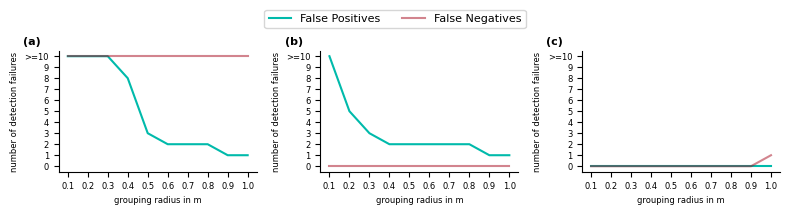

In [202]:
# Conditions to plot
df = pd.read_pickle('../../../datasets_simlink/data_trees/figures_appendix/appendix_data_simplified.pkl')
# conditions = ['treelearn', 'treelearn_filter', 'treelearn_filter_class', 'treelearn_finetuned_filter_class']
conditions = ['treelearn', 'treelearn_filter', 'treelearn_filter_class']

# Define a custom tick formatter function
def custom_y_tick_formatter(value, pos):
    if value == 10:
        return ">=10"
    else:
        return int(value)  # Display other tick labels as integers

# Define plot parameters
fontsize = 6
fig_size = (8, 2)
legend_size = 10  # Increase legend size
bbox_to_anchor = (0.5, 1.08)  # Move the legend further to the right
cols = ['#010003', '#00baab', '#a60a1f']
col1 = cols[1]
col2 = cols[2]
plot_from = 2
axis_ticks_fontsize = 6 # New parameter for axis tick font size

# Create subplots with the specified figsize
fig, axs = plt.subplots(1, 3, figsize=fig_size)

# Update the y-axis tick labels for all plots
for ax in axs:
    ax.yaxis.set_major_formatter(plt.FuncFormatter(custom_y_tick_formatter))

y_limit = (-0.5, 10.5)  # Adjust the lower bound (-0.5) as needed
for ax in axs:
    ax.set_ylim(y_limit)

# Plot each condition
for i, condition in enumerate(conditions):
    # Aggregate values for the condition
    fp = df[f'fp_{condition}']
    fn = df[f'fn_{condition}']

    # Plot the data
    axs[i].plot(radii[plot_from:], fp[plot_from:], color=col1, label='False Positives')
    axs[i].plot(radii[plot_from:], fn[plot_from:], color=col2, label='False Negatives', alpha=0.5)
    # axs[i].set_title(condition)
    axs[i].set_xlabel('grouping radius in m', fontsize=fontsize)
    axs[i].set_ylabel('number of detection failures', fontsize=fontsize)
    axs[i].set_xticks(radii[plot_from:])
    axs[i].set_yticks(range(0, 11))

    # Remove horizontal and vertical boundaries
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    
    # Add (a), (b), (c), (d) to the subplots
    axs[i].text(-0.18, 1.05, f'({chr(97 + i)})', transform=axs[i].transAxes, fontsize=8, weight='bold')

# Create a legend for the second plot only
# axs[1].legend(fontsize=legend_size, labels=['FP', 'FN'], bbox_to_anchor=bbox_to_anchor, ncol=2)
handles, labels = axs[0].get_legend_handles_labels()  # Use axs[0] to get legend handles and labels
fig.legend(handles, labels, loc='upper center', ncol=2, bbox_to_anchor=bbox_to_anchor, fontsize=8)

# Adjust axis tick font size for all plots
for ax in axs:
    ax.tick_params(axis='both', which='both', labelsize=axis_ticks_fontsize)

plt.tight_layout()
plt.savefig(os.path.join(save_dir, 'appendix.pdf'), bbox_inches='tight')
